In [1]:
%matplotlib inline
import matplotlib.image as mpimg
import numpy as np
import matplotlib.pyplot as plt
import os,sys
from PIL import Image

In [2]:
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model, load_model
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras.layers import Input, Dropout, Lambda
from tensorflow.keras.layers import Conv2D, Conv2DTranspose
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import concatenate
from tensorflow.keras import optimizers
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.metrics import MeanIoU


In [3]:
# Helper functions

def load_image(infilename):
    data = mpimg.imread(infilename)
    return data

def img_float_to_uint8(img):
    rimg = img - np.min(img)
    rimg = (rimg / np.max(rimg) * 255).round().astype(np.uint8)
    return rimg

# Concatenate an image and its groundtruth
def concatenate_images(img, gt_img):
    nChannels = len(gt_img.shape)
    w = gt_img.shape[0]
    h = gt_img.shape[1]
    if nChannels == 3:
        cimg = np.concatenate((img, gt_img), axis=1)
    else:
        gt_img_3c = np.zeros((w, h, 3), dtype=np.uint8)
        gt_img8 = img_float_to_uint8(gt_img)          
        gt_img_3c[:,:,0] = gt_img8
        gt_img_3c[:,:,1] = gt_img8
        gt_img_3c[:,:,2] = gt_img8
        img8 = img_float_to_uint8(img)
        cimg = np.concatenate((img8, gt_img_3c), axis=1)
    return cimg

In [4]:
# Loaded a set of images
root_dir = "../data/training/"

image_dir = root_dir + "images/"
files = os.listdir(image_dir)
n = len(files)
print("Loading " + str(n) + " images")
imgs = [load_image(image_dir + files[i]) for i in range(n)]
print(files[0])

gt_dir = root_dir + "groundtruth/"
print("Loading " + str(n) + " images")
gt_imgs = [load_image(gt_dir + files[i]) for i in range(n)]
print(files[0])

Loading 100 images
satImage_072.png
Loading 100 images
satImage_072.png


In [5]:
gt_imgs[0].shape

(400, 400)

Image size = 400,400


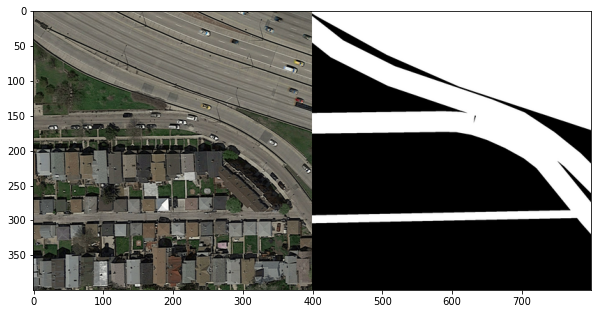

In [6]:
print('Image size = ' + str(imgs[0].shape[0]) + ',' + str(imgs[0].shape[1]))

# Show first image and its groundtruth image
cimg = concatenate_images(imgs[0], gt_imgs[0])
fig1 = plt.figure(figsize=(10, 10))
plt.imshow(cimg, cmap='Greys_r')

In [7]:
imgs = np.array(imgs)
gt_imgs = np.expand_dims(np.array(gt_imgs), -1)
print(imgs.shape)
print(gt_imgs.shape)

(100, 400, 400, 3)
(100, 400, 400, 1)


In [8]:
#Source: https://towardsdatascience.com/metrics-to-evaluate-your-semantic-segmentation-model-6bcb99639aa2
def iou_coef(y_true, y_pred, smooth=1):
    intersection = K.sum(K.abs(y_true * y_pred), axis=[1,2,3])
    union = K.sum(y_true,[1,2,3])+K.sum(y_pred,[1,2,3])-intersection
    iou = K.mean((intersection + smooth) / (union + smooth), axis=0)
  
    return iou

In [9]:
def dice_coef(y_true, y_pred, smooth = 1):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def soft_dice_loss(y_true, y_pred):
    return 1-dice_coef(y_true, y_pred)

In [10]:
from sklearn.model_selection import train_test_split

seed = 1

train_images, test_images, train_masks, test_masks = train_test_split(imgs, gt_imgs, test_size=0.2, random_state=seed)
#del imgs, gt_imgs
print("TRAIN SET")
print(train_images.shape)
print(train_masks.shape)
print("TEST SET")
print(test_images.shape)
print(test_masks.shape)

TRAIN SET
(80, 400, 400, 3)
(80, 400, 400, 1)
TEST SET
(20, 400, 400, 3)
(20, 400, 400, 1)


In [11]:
IMAGE_HEIGHT = IMAGE_WIDTH = 400
NUM_CHANNELS = 3

In [12]:
inputs = Input((IMAGE_HEIGHT, IMAGE_WIDTH, 3))
#s = Lambda(lambda x: x / 255) (inputs)

conv1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (inputs)
conv1 = BatchNormalization() (conv1)
conv1 = Dropout(0.1) (conv1)
conv1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1)
conv1 = BatchNormalization() (conv1)
pooling1 = MaxPooling2D((2, 2)) (conv1)

conv2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (pooling1)
conv2 = BatchNormalization() (conv2)
conv2 = Dropout(0.1) (conv2)
conv2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2)
conv2 = BatchNormalization() (conv2)
pooling2 = MaxPooling2D((2, 2)) (conv2)

conv3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (pooling2)
conv3 = BatchNormalization() (conv3)
conv3 = Dropout(0.2) (conv3)
conv3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3)
conv3 = BatchNormalization() (conv3)
pooling3 = MaxPooling2D((2, 2)) (conv3)

conv4 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (pooling3)
conv4 = BatchNormalization() (conv4)
conv4 = Dropout(0.2) (conv4)
conv4 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv4)
conv4 = BatchNormalization() (conv4)
pooling4 = MaxPooling2D(pool_size=(2, 2)) (conv4)

conv5 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (pooling4)
conv5 = BatchNormalization() (conv5)
conv5 = Dropout(0.3) (conv5)
conv5 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv5)
conv5 = BatchNormalization() (conv5)


upsample6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (conv5)
upsample6 = concatenate([upsample6, conv4])
conv6 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (upsample6)
conv6 = BatchNormalization() (conv6)
conv6 = Dropout(0.2) (conv6)
conv6 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv6)
conv6 = BatchNormalization() (conv6)

upsample7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (conv6)
upsample7 = concatenate([upsample7, conv3])
conv7 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (upsample7)
conv7 = BatchNormalization() (conv7)
conv7 = Dropout(0.2) (conv7)
conv7 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv7)
conv7 = BatchNormalization() (conv7)

upsample8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (conv7)
upsample8 = concatenate([upsample8, conv2])
conv8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (upsample8)
conv8 = BatchNormalization() (conv8)
conv8 = Dropout(0.1) (conv8)
conv8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv8)
conv8 = BatchNormalization() (conv8)

upsample9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (conv8)
upsample9 = concatenate([upsample9, conv1], axis=3)
conv9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (upsample9)
conv9 = BatchNormalization() (conv9)
conv9 = Dropout(0.1) (conv9)
conv9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv9)
conv9 = BatchNormalization() (conv9)

outputs = Conv2D(1, (1, 1), activation='sigmoid') (conv9)

model = Model(inputs=[inputs], outputs=[outputs])
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 400, 400, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 400, 400, 16) 448         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 400, 400, 16) 64          conv2d[0][0]                     
__________________________________________________________________________________________________
dropout (Dropout)               (None, 400, 400, 16) 0           batch_normalization[0][0]        
_______________________________________________________________________________________

In [13]:
train_images.shape

(80, 400, 400, 3)

In [14]:
EPOCHS = 100
LEARNING_RATE = 0.0001
BATCH_SIZE = 16

In [15]:
opt = keras.optimizers.Adam(LEARNING_RATE)
bce = tf.keras.losses.BinaryCrossentropy()
model.compile(
      optimizer=opt,
      loss=bce)#,
      #metrics=[iou_coef])

In [16]:
history = model.fit(train_images,
                    train_masks,
                    validation_split = 0.05,
                    epochs=EPOCHS,
                    batch_size = BATCH_SIZE)

Epoch 1/100
5/5 [==============================] - 69s 14s/step - loss: 0.8068 - val_loss: 0.7550
Epoch 2/100
5/5 [==============================] - 69s 14s/step - loss: 0.7868 - val_loss: 0.7387
Epoch 3/100
5/5 [==============================] - 68s 14s/step - loss: 0.7699 - val_loss: 0.7472
Epoch 4/100
5/5 [==============================] - 67s 13s/step - loss: 0.7552 - val_loss: 0.7759
Epoch 5/100
5/5 [==============================] - 68s 14s/step - loss: 0.7409 - val_loss: 0.8340
Epoch 6/100
5/5 [==============================] - 67s 13s/step - loss: 0.7276 - val_loss: 0.9046
Epoch 7/100
5/5 [==============================] - 68s 14s/step - loss: 0.7138 - val_loss: 0.9434
Epoch 8/100
5/5 [==============================] - 67s 13s/step - loss: 0.6964 - val_loss: 0.8761
Epoch 9/100
5/5 [==============================] - 67s 13s/step - loss: 0.6799 - val_loss: 1.2541
Epoch 10/100
5/5 [==============================] - 68s 14s/step - loss: 0.6582 - val_loss: 1.3377
Epoch 11/100
5/5 [=

Epoch 84/100
5/5 [==============================] - 67s 13s/step - loss: 0.3051 - val_loss: 0.4239
Epoch 85/100
5/5 [==============================] - 67s 13s/step - loss: 0.3025 - val_loss: 0.4749
Epoch 86/100
5/5 [==============================] - 67s 13s/step - loss: 0.3018 - val_loss: 0.4844
Epoch 87/100
5/5 [==============================] - 67s 13s/step - loss: 0.2980 - val_loss: 0.4486
Epoch 88/100
5/5 [==============================] - 67s 13s/step - loss: 0.2990 - val_loss: 0.4793
Epoch 89/100
5/5 [==============================] - 67s 13s/step - loss: 0.2962 - val_loss: 0.4925
Epoch 90/100
5/5 [==============================] - 67s 13s/step - loss: 0.2946 - val_loss: 0.4273
Epoch 91/100
5/5 [==============================] - 68s 14s/step - loss: 0.2955 - val_loss: 0.5188
Epoch 92/100
5/5 [==============================] - 68s 14s/step - loss: 0.2976 - val_loss: 0.4434
Epoch 93/100
5/5 [==============================] - 68s 14s/step - loss: 0.2917 - val_loss: 0.4942
Epoch 94/1

In [17]:
model.save("model.h5")

In [18]:
model.evaluate(test_images, test_masks)

1/1 [==============================] - 0s 928us/step - loss: 0.3101


0.3100561499595642

In [19]:
predictions = model.predict(test_images, verbose=1)
predictions_train = model.predict(train_images)

1/1 [==============================] - 0s 4ms/step


In [20]:
test_masks[0].shape

(400, 400, 1)

In [21]:
predictions[0].shape

(400, 400, 1)

In [22]:
bce(predictions[1], test_masks[1])

<tf.Tensor: shape=(), dtype=float32, numpy=1.5054885>

<ipython-input-25-ac7f60fa4fc2>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig1 = plt.figure(figsize=(10, 10))


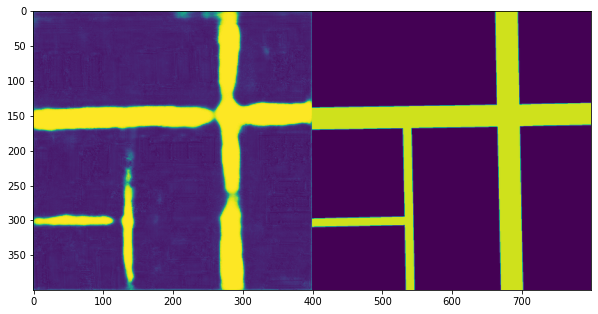

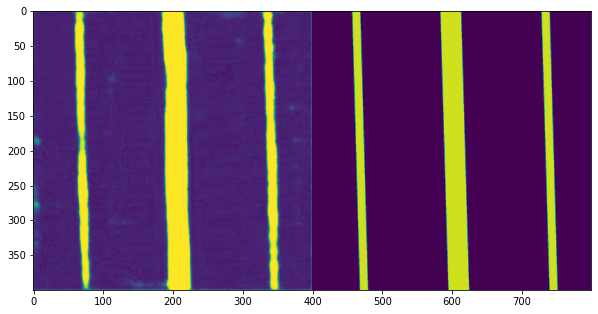

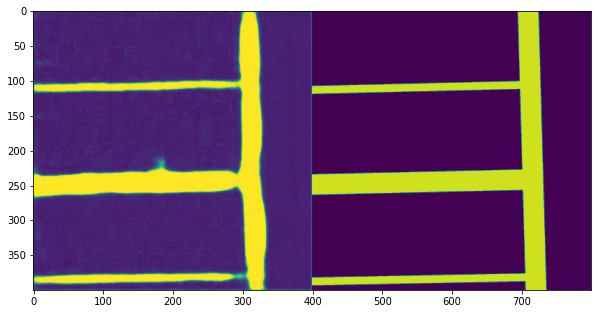

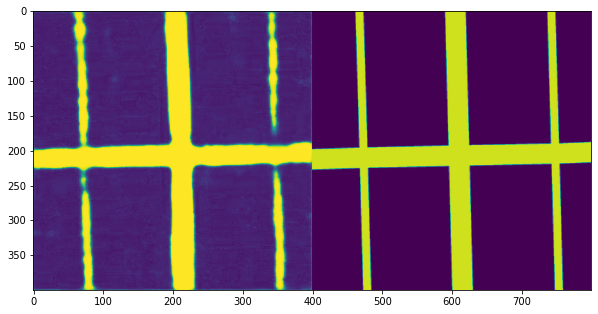

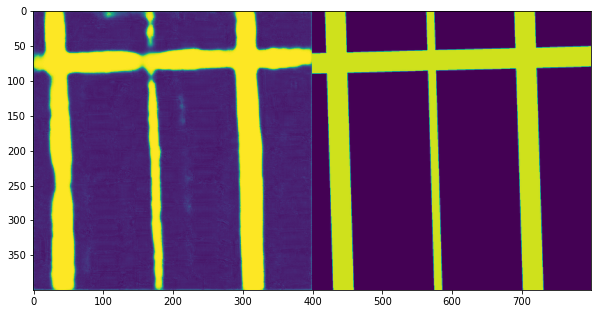

...

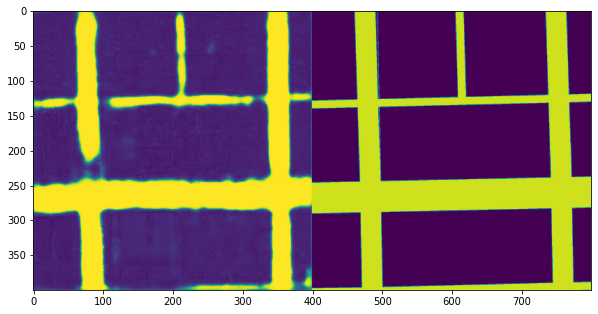

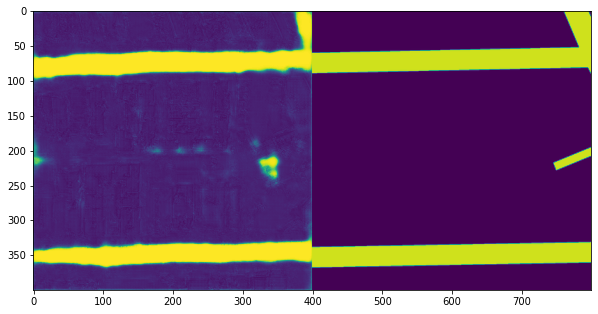

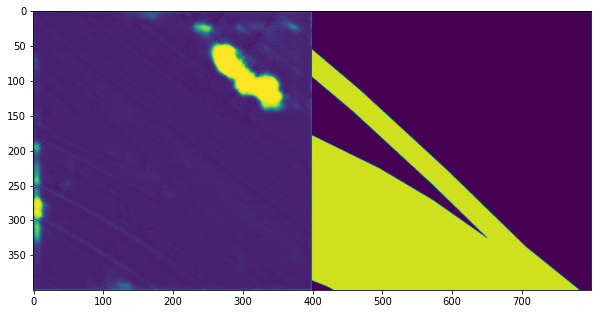

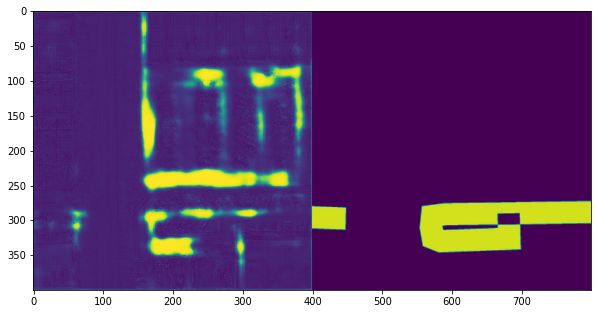

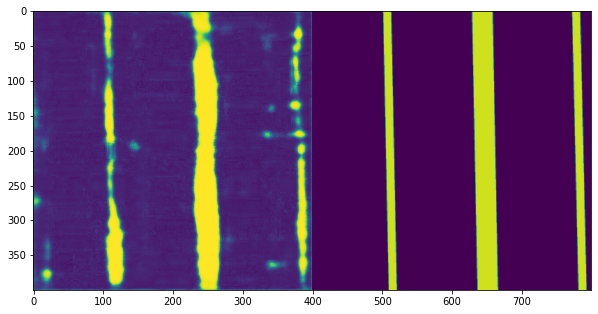

In [25]:
for i in range(len(predictions_train)):
    cimg = np.squeeze(concatenate_images(predictions_train[i], train_masks[i]))
    fig1 = plt.figure(figsize=(10, 10))
    plt.imshow(cimg)

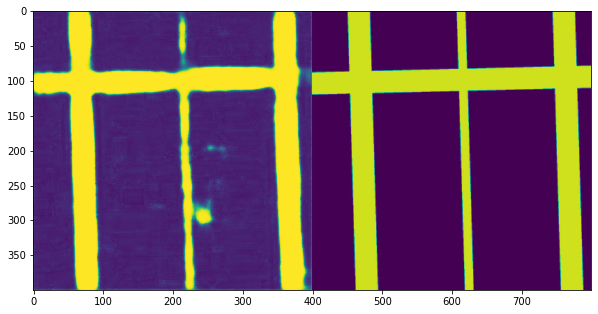

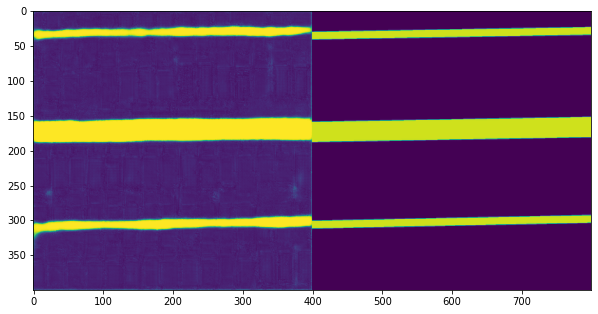

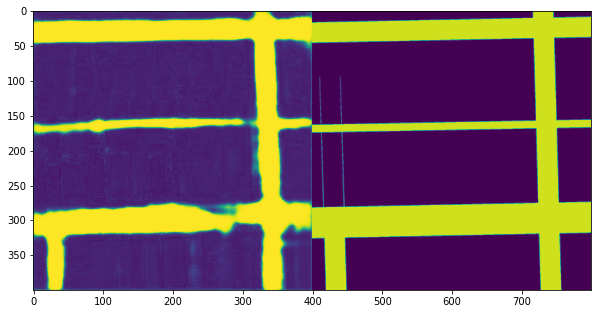

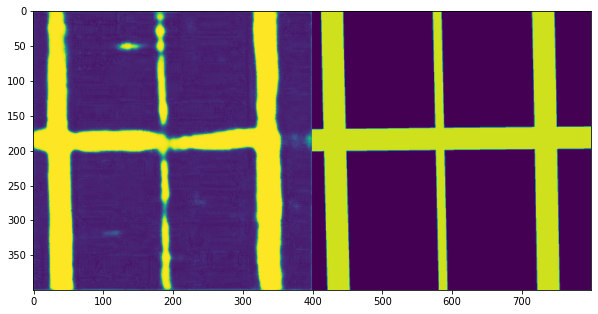

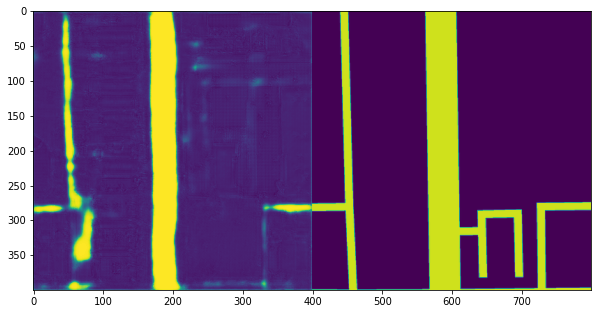

...

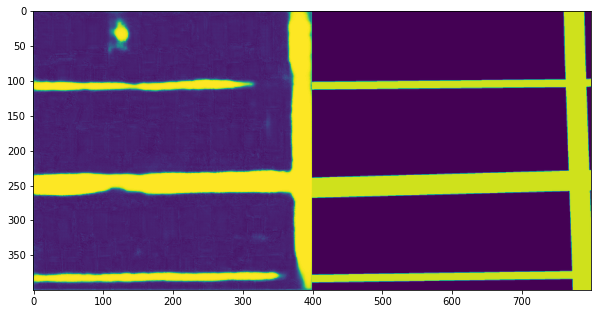

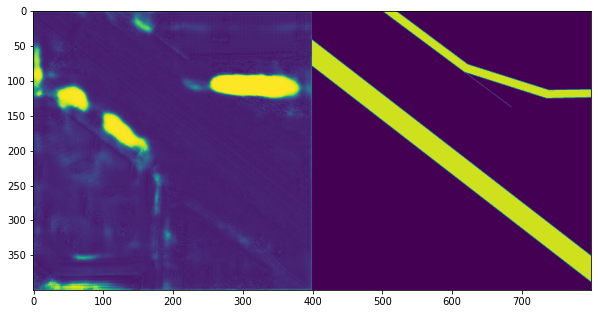

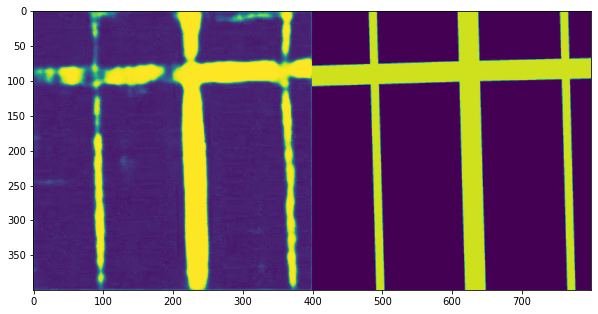

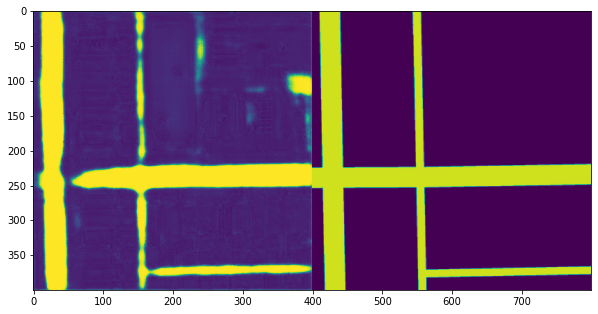

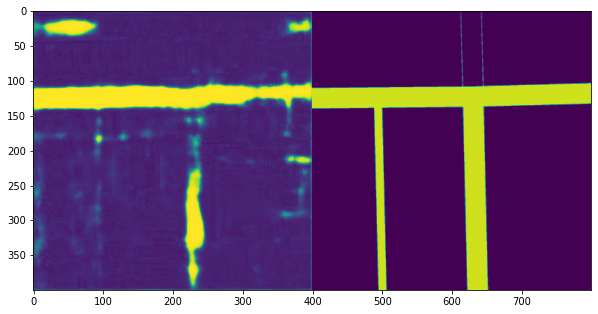

In [27]:
for i in range(len(predictions)):
    cimg = np.squeeze(concatenate_images(predictions[i], test_masks[i]))
    fig1 = plt.figure(figsize=(10, 10))
    plt.imshow(cimg)